# Breast Cancer Histopathology Detection Using Deep-Learning

## Notebook prepared as a training example for Healthcare Image Analysis (HIMA)

### Authors: [Dr. Rahul Remanan (nanøveda)](remananr.com/Blog)



### Overview:

Breast cancer starts when cells in the breast begin to grow out of control. These cells usually form a tumor that can often be seen on an x-ray or felt as a lump. The tumor is malignant (cancer) if the cells can grow into (invade) surrounding tissues or spread (metastasize) to distant areas of the body. Breast cancer occurs almost entirely in women, but men can get breast cancer, too.[1](https://www.cancer.org/cancer/breast-cancer/about/what-is-breast-cancer.html)

In the United States, breast cancer is the most commonly diagnosed type of cancer and the thrid leading cause of cancer-related deaths among women.[2](https://seer.cancer.gov/statfacts/html/breast.html) In the U.S., the five-year survival rate for breast cancer is 89.7%.[3](https://seer.cancer.gov/statfacts/html/breast.html) An early diagnosis and treatment of this cancer can significantly increase the chance of survival.

For the purpose of early diagnosis, proper histophatological analysis of tissue samples is very important. During the diagnostic work-up, suspected tissue samples are evaluated for both overall and region specific tissue organization using whole-slide and microscopic images respectively. However, the large amount of data and complexity of these images make this task time consuming and non-trivial.[4](https://iciar2018-challenge.grand-challenge.org/home/) Therefore, the development of an automated breast cancer histopathology classification tool is essential for the field, to further improve the breast cancer survival rates.


### Methodology:

* Convolutional neural network using the Incpetion version 3 network.[5](https://arxiv.org/abs/1512.00567)
* Transfer learning using model weights trained on the Imagenet dataset.
* End-to-end deep-learning architecture (from feature extraction to final classification).
* Added a stacked fully connected dense layer architecture on top of the Inception layers.
* A set of custom drop-out layers to reduce overfitting.
* The training dataset (N=400) was subjected to image augmentation resulting in 16x increase sample size.
* Augmented data (N=6400) split into 5600 images for training and 800 images for validation.
* Final accuracy, sensitivity and specificity, calculated using separate un-exposed test dataset of 32 images.[6](http://www.bioimaging2015.ineb.up.pt/challenge_overview.html#)

## Results:



In [1]:
from IPython.display import HTML, display
display(HTML('<table><tr><th>Classification Accuracy (%)</th><th>Sensitivity (%)</th><th>Specificity (%)</th></tr><tr><d><b>Model 42a</b></td></tr><tr><td>88.88 (32/36)</td><td>94.44 (17/18)</td><td>83.33 (15/18)</td></tr></table>'
))

Classification Accuracy (%),Sensitivity (%),Specificity (%)
88.88 (32/36),94.44 (17/18),83.33 (15/18)


## Conclusion:

An end-to-end deep-neural network based on the Inception version 3 architecture was successfully trained using a technique called transfer learning to classify breast cancer histopathology images. The model achieved a classification accuracy of 88.88%, sensitivity of 94.44% and specificity of 83.33% when tested using a test dataset (N=32) that was not exposed to the model during training. The model described here has achieved a better accuracy, sensitvity and specificity than a previous approach. Araújo et.al combined a convolutional neural network feature extractor with a support vector machine classifier.[7](http://journals.plos.org/plosone/article?id=10.1371/journal.pone.0177544) Both models were tested on the same dataset. This increased performance is due a state-of-the-art, highly optimized, end-to-end deep-learning architecture used in the model described here.

## Demo:

### Importing the necessary libraries:

* The model is built using tensorflow and keras

In [2]:
import sys
import argparse
import numpy as np
from PIL import Image
import requests
from io import BytesIO
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import os
import time
import json
from keras.models import model_from_json
from keras.preprocessing import image
from keras.applications.inception_v3 import preprocess_input
from keras.models import model_from_json
from keras.optimizers import SGD, RMSprop, Adagrad
import types
from IPython.display import Image as PyImage
from IPython.core.display import HTML
import gc

Using TensorFlow backend.


### Defining variables and creating functions:

In [3]:
target_size = (299, 299) 

In [4]:
def generate_timestamp():
    timestring = time.strftime("%Y_%m_%d-%H_%M_%S")
    print ("Time stamp generated: "+timestring)
    return timestring

In [5]:
def is_valid_file(parser, arg):
    if not os.path.isfile(arg):
        parser.error("The file %s does not exist ..." % arg)
    else:
        return arg

In [6]:
def is_valid_dir(parser, arg):
    if not os.path.isdir(arg):
        parser.error("The folder %s does not exist ..." % arg)
    else:
        return arg

In [7]:
def load_prediction_model(args):
    try:
        print (args.config_file[0]) 
        with open(args.config_file[0]) as json_file:
              model_json = json_file.read()
        model = model_from_json(model_json)
    except:
          print ("Please specify a model configuration file ...")
          sys.exit(1)
    try:
          model.load_weights(args.weights_file[0])
          print ("Loaded model weights from: " + str(args.weights_file[0]))
    except:
          print ("Error loading model weights ...")
          sys.exit(1)
    try:
        print (args.labels_file[0])
        with open(args.labels_file[0]) as json_file:
            labels = json.load(json_file)
        print ("Loaded labels from: " + str(args.labels_file[0]))
    except:
        print ("No labels loaded ...")
        sys.exit(1)
    #compile_model(model)
    return model, labels

In [8]:
def plot_preds(preds, labels, timestr):
  output_loc = args.output_dir[0]
  output_file_preds = os.path.join(output_loc+"//preds_out_"+timestr+".png")
  fig = plt.figure()
  plt.axis('on')
  labels = labels
  plt.barh(list(range(0, len(labels))), preds, alpha=0.5)
  plt.yticks(list(range(0, len(labels))), labels)
  plt.xlabel('Probability')
  plt.xlim(0,1.01)
  plt.tight_layout()
  fig.savefig(output_file_preds, dpi=fig.dpi)
  plt.close()

In [9]:
def predict(model, img, target_size):
  print ("Running prediction model on the image file ...")
  if img.size != target_size:
    img = img.resize(target_size)

  _x_ = image.img_to_array(img)
  _x_ = np.expand_dims(_x_, axis=0)
  _x_ = preprocess_input(_x_)
  preds = model.predict(_x_)
  probabilities = model.predict(_x_, batch_size=1).flatten()
  prediction = labels[np.argmax(probabilities)]
  return preds[0], prediction

In [10]:
def gen_output(args, model, labels, target_size):
    if len(args.image) !=0:
        try:
            img = Image.open(args.image[0])
            preds = predict(model, img, target_size)
            print (preds[1] + "\t" + "\t".join(map(lambda x: "%.2f" % x, preds[0])))
            print (str(preds[1]))
            timestr = generate_timestamp()
            plot_preds(preds[0], labels, timestr)
            del (img)
        except:
            print ("Error reading image file ...")
    elif len(args.image_url) !=0:
        try:
            response = requests.get(args.image_url[0])
            img = Image.open(BytesIO(response.content))
            preds = predict(model, img, target_size)
            del (img)
            print (preds[1] + "\t" + "\t".join(map(lambda x: "%.2f" % x, preds[0])))
            print (str(preds[1]))
            timestr = generate_timestamp()
            plot_preds(preds[0], labels, timestr)
        except:
            print ("Error reading image url ...")
    return timestr

### Loading the data:

* Loads images, model configuration file, model weights and class labels
* Specifies the output directory to write the files

In [11]:
args = types.SimpleNamespace()
args.config_file = ['./model/model_efc.json']
args.weights_file = ['../../../model/trained_weights_42a.model']
args.labels_file = ['./model/trained_labels.json']
args.output_dir = ['./output/']

### Generating the prediction model:

* Using the model configuration files and the model weights, a prediction model is generated
* Four output categories: Normal, Benign, In-situ and Invasive
* The output classification corresponds to the most common classes a pathologist needs to generate after examing a breast tissue slide

In [12]:
model, labels = load_prediction_model(args)

./model/model_efc.json
Instructions for updating:
keep_dims is deprecated, use keepdims instead
Loaded model weights from: ../../../model/trained_weights_42a.model
./model/trained_labels.json
Loaded labels from: ./model/trained_labels.json


### Testing on normal tissue:

* Using a normal histopathology microscopy image, we will test the output of the prediction model.

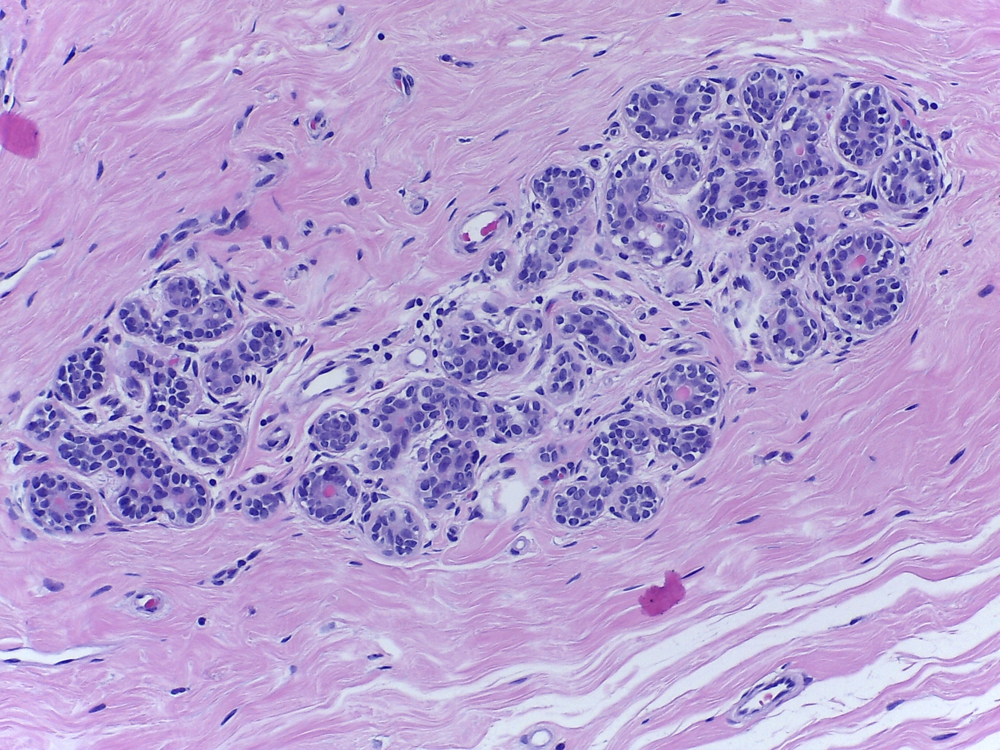

In [13]:
args.image = ['./test/00.jpg']
PyImage(args.image[0])

In [14]:
timestr = gen_output(args, model, labels, target_size)

Running prediction model on the image file ...
Normal	0.00	0.00	0.00	1.00
Normal
Time stamp generated: 2018_01_02-00_02_21


#### Confidence level of the prediction:

* The graph below shows the confidence level of the model while generating the predictions

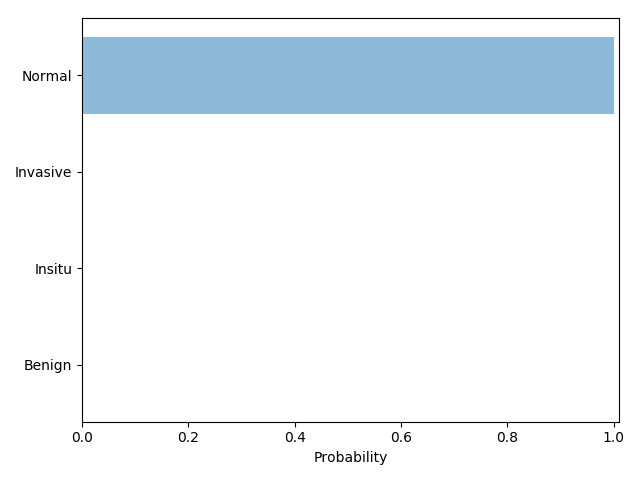

In [15]:
img_pred_plot = os.path.join('./output/preds_out_'+timestr+'.png')
PyImage(img_pred_plot)

In [16]:
del (img_pred_plot)
gc.collect()

89576

### Testing on benign tissue:

* A benign breast tissue microscopy image is tested below

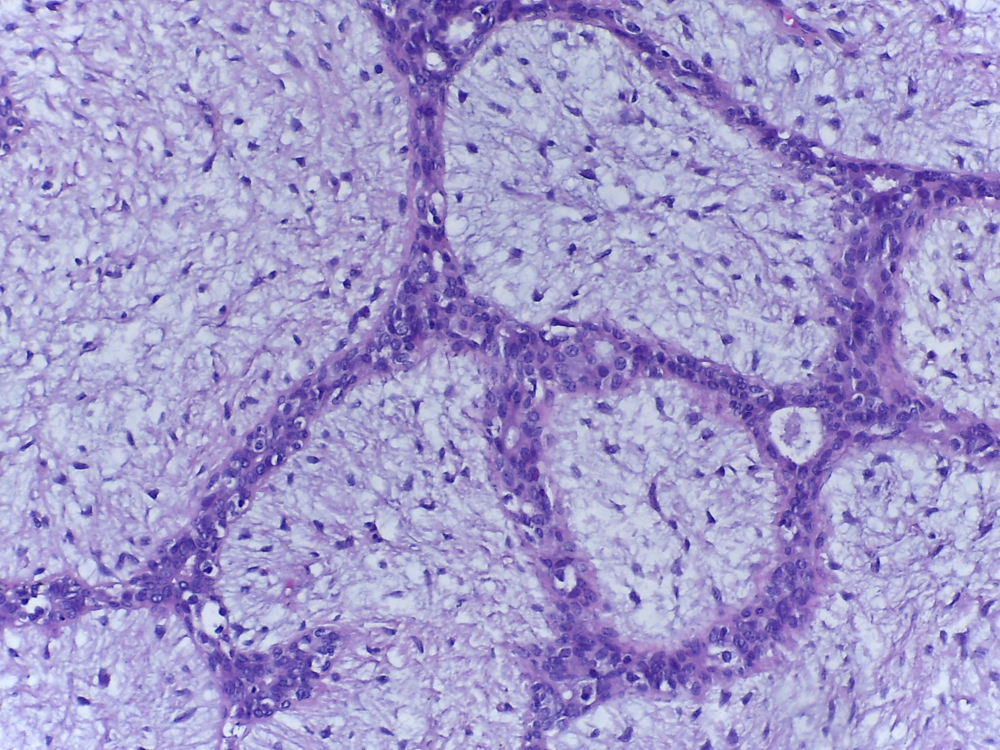

In [17]:
args.image = ['./test/09.jpg']
PyImage(args.image[0])

In [18]:
timestr = gen_output(args, model, labels, target_size)

Running prediction model on the image file ...
Benign	1.00	0.00	0.00	0.00
Benign
Time stamp generated: 2018_01_02-00_02_23


#### Confidence level of the prediction:

* The graph below shows the confidence level of the model while generating the predictions

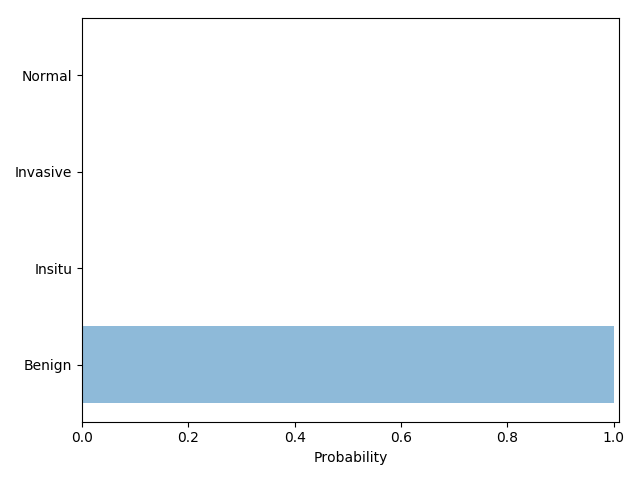

In [19]:
img_pred_plot = os.path.join('./output/preds_out_'+timestr+'.png')
PyImage(img_pred_plot)

In [20]:
del (img_pred_plot)
gc.collect()

2170

### Testing on in-situ carcinoma:

* Breast tissue microscopy image with histopathology features of in-situ carcinoma will be tested next

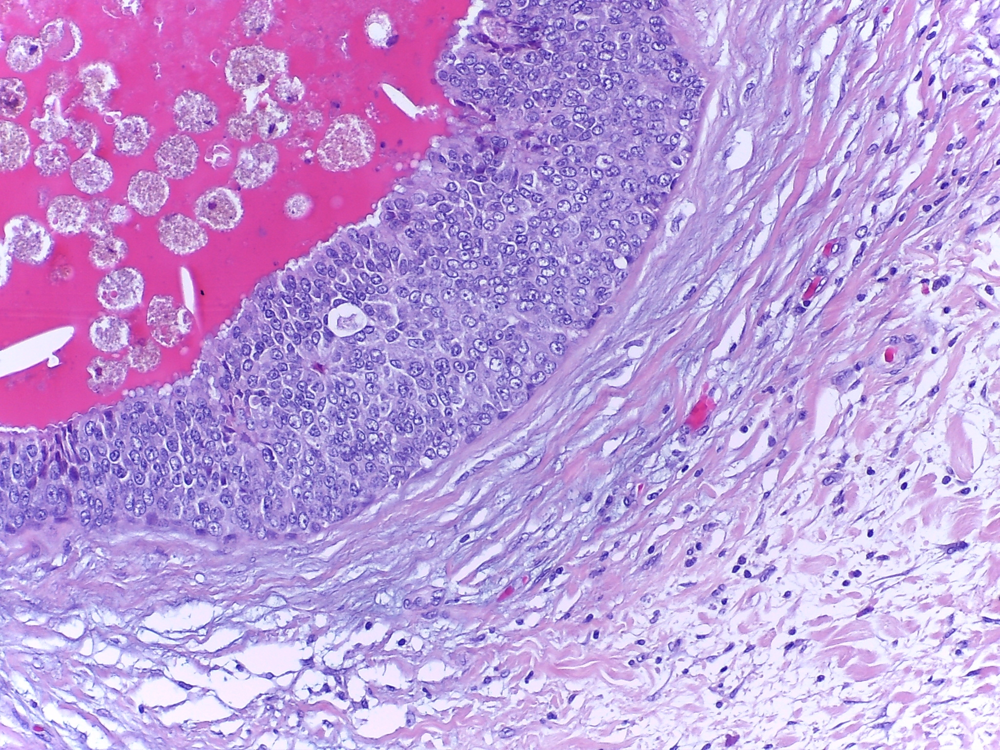

In [21]:
args.image = ['./test/10.jpg']
PyImage(args.image[0])

In [22]:
timestr = gen_output(args, model, labels, target_size)

Running prediction model on the image file ...
Insitu	0.00	1.00	0.00	0.00
Insitu
Time stamp generated: 2018_01_02-00_02_24


#### Confidence level of the prediction:

* The graph below shows the confidence level of the model while generating the predictions

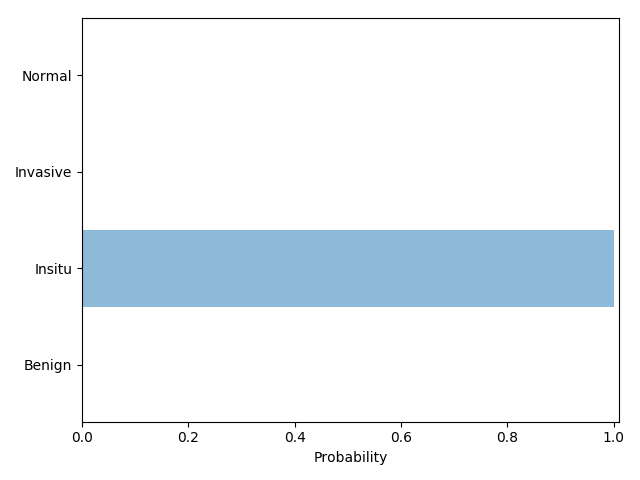

In [23]:
img_pred_plot = os.path.join('./output/preds_out_'+timestr+'.png')
PyImage(img_pred_plot)

In [24]:
del (img_pred_plot)
gc.collect()

2173

### Testing on invasive carcinoma:

* Microscopy images of invasive breast cancer is tested next

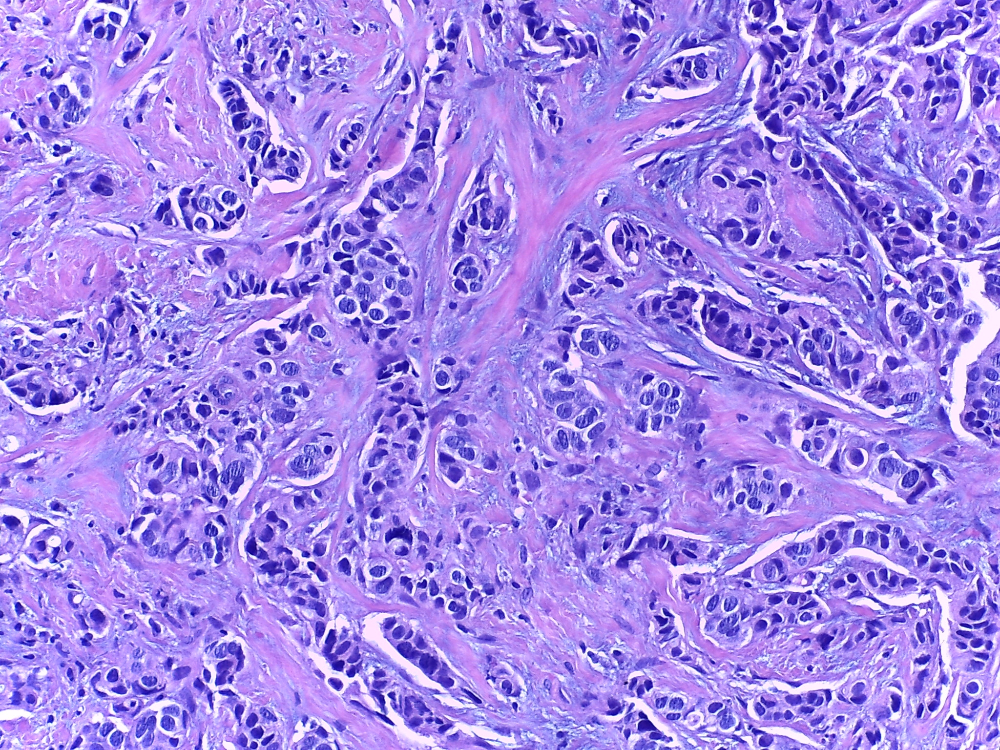

In [25]:
args.image = ['./test/18.jpg']
PyImage(args.image[0])

In [26]:
timestr = gen_output(args, model, labels, target_size)

Running prediction model on the image file ...
Invasive	0.00	0.00	1.00	0.00
Invasive
Time stamp generated: 2018_01_02-00_02_25


#### Confidence level of the prediction:

* The graph below shows the confidence level of the model while generating the predictions

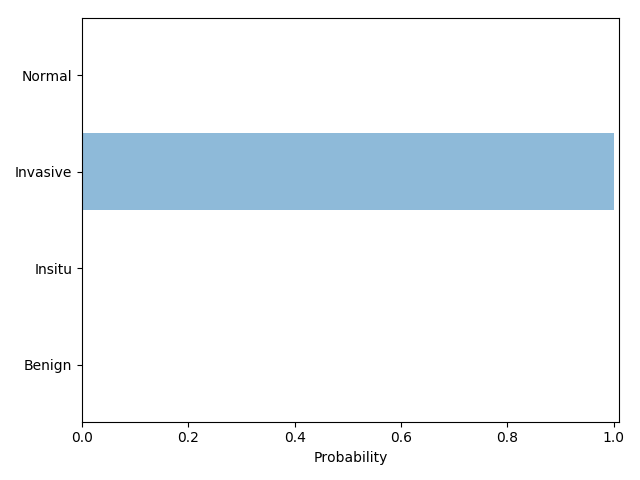

In [27]:
img_pred_plot = os.path.join('./output/preds_out_'+timestr+'.png')
PyImage(img_pred_plot)

In [28]:
del (img_pred_plot)
del (args.image[0])
gc.collect()

2171

### Testing the algorithm using an image from Johns Hopkins Medical Center website:

* [Microscopic image of the breast tissue showing invasive ductal carcinoma (IDC).](https://goo.gl/kjRAUf)

In [29]:
args.image_url = ['https://goo.gl/kjRAUf']
PyImage(url = args.image_url[0])

In [30]:
timestr = gen_output(args, model, labels, target_size)

Running prediction model on the image file ...
Invasive	0.00	0.00	1.00	0.00
Invasive
Time stamp generated: 2018_01_02-00_02_27


#### Confidence level of the prediction:

* The graph below shows the confidence level of the model while generating the predictions

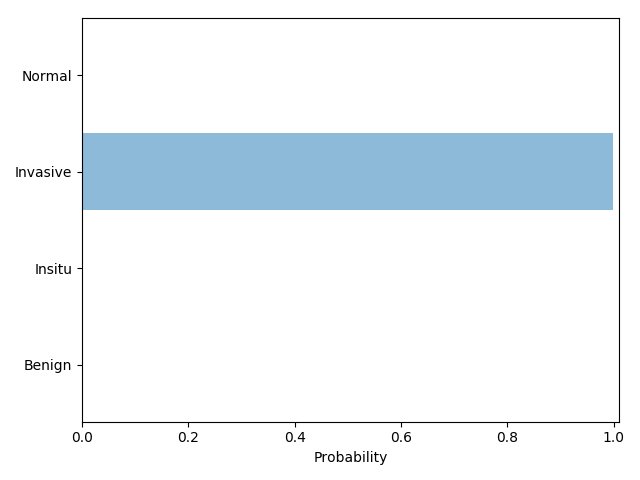

In [31]:
img_pred_plot = os.path.join('./output/preds_out_'+timestr+'.png')
PyImage(img_pred_plot)

In [32]:
del (img_pred_plot)
gc.collect()

2172

### Running prediction on an un-exposed  ductal carcinoma insitu image:

* [Microscopic image of the breast tissue showing ductal carcinoma in-situ (DCIS).](https://goo.gl/RyMjBD)

In [33]:
args.image_url = ['https://goo.gl/RyMjBD']
PyImage(url = args.image_url[0])

In [34]:
timestr = gen_output(args, model, labels, target_size)

Running prediction model on the image file ...
Insitu	0.00	1.00	0.00	0.00
Insitu
Time stamp generated: 2018_01_02-00_02_29


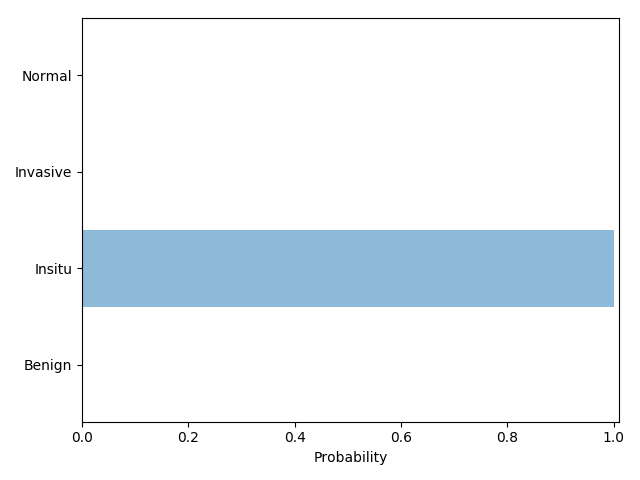

In [35]:
img_pred_plot = os.path.join('./output/preds_out_'+timestr+'.png')
PyImage(img_pred_plot)